<a href="https://colab.research.google.com/github/clarissanjani/ECML_PKDD_TaxiTrajectoryPrediction/blob/main/AS_LSCM_FourSquare.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Import Packages

This Google Colab extracts data from the FourSquare Places V3 API which is the most updated version of the API at this time of writing. The purpose of this data extraction is to integrate with the taxi mobility data from the ECML/PKDD Porto taxi trjectory dataset. Version 3 of the API allowed only an extraction of 67 points of interest. Version 3 of the Places API is the latest version, while previous approaches used the version 2 of the API which has already been deprecated for new implementations.

Some code was taken from, but the code uses V2 of the FourSquare Places API: 
https://colab.research.google.com/github/amitthakur2013/Coursera_Capstone/blob/master/Four_Square.ipynb#scrollTo=H4sMx2-Cd7Xc

In [ ]:
import requests
import pandas as pd
import numpy as np
import random
import seaborn as sns

!pip install geopy
from geopy.geocoders import Nominatim

from IPython.display import Image
from IPython.core.display import HTML

#transforming json files into pandas data frame
from pandas.io.json import json_normalize


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install folium
import folium
print('Folium installed')
print('Libraries Imported!')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Folium installed
Libraries Imported!


# 2. Authenticating to the dataset

Define Foursquare credentials and version

In [ ]:
CLIENT_ID='VBA32TS3JTH3MOPC4O40TVPNAWOWRWNZ0N22Y5WO221JDGTC'
CLIENT_SECRET='FUJCJQLVDJTJ2C2ZCYSAMBMBB5LSK3IFVSH2I2BZVVW04B3O'
VERSION="20220611"
LIMIT=30
print('Your Credentials:-')
print('CLIENT_ID: '+CLIENT_ID)
print('CLIENT_SECRET '+CLIENT_SECRET)

Your Credentials:-
CLIENT_ID: VBA32TS3JTH3MOPC4O40TVPNAWOWRWNZ0N22Y5WO221JDGTC
CLIENT_SECRET FUJCJQLVDJTJ2C2ZCYSAMBMBB5LSK3IFVSH2I2BZVVW04B3O


# 3. Set up the dataframe

Set up a base longitude and latitude

In [ ]:
address='Ponte Dom Luís I, Porto, Portugal'
geolocator=Nominatim(user_agent='foursquare_agent')
location=geolocator.geocode(address)
latitude=location.latitude
longitude=location.longitude
print(latitude, longitude)

41.1408993 -8.6096857


In [ ]:
# Rough estimation of a range to find longitude and latitudes
lat_distributor = (41.3 - 41.0) / 180
lon_distributor = (-8.4 + 8.8) / 180
print(lat_distributor, " ", lon_distributor)

0.001666666666666651   0.0022222222222222244


In [ ]:
# create a list of latitudes and longitudes
base_lat = 41.0
base_lon = -8.8
coordinates = []
for i in range(0, 160):
  base_lat +=  lat_distributor
  base_lon += lon_distributor
  coordinates.append([base_lat, base_lon])

In [ ]:
# limit of number of venues returned by Foursquare API
limit = 50 
radius = 100000
sort = 'POPULARITY'

In [ ]:
import json as json

In [ ]:
# start a master places_df
url = 'https://api.foursquare.com/v3/places/search?&client_id={}&client_secret={}&ll={},{}&radius={}&limit={}&sort={}'.format(
      CLIENT_ID, 
      CLIENT_SECRET, 
      latitude, # latitude
      longitude, # longitude
      radius,
      limit,
      sort)
headers = {'Accept': 'application/json', 'Authorization': 'fsq3cv7pqLMSFZGW2cnY14OD3VFV24sPHOKD7A+HepCazgI='}
results = requests.get(url, headers=headers)
results.json()
results = json.loads(results.text)
places = results['results']
master_places_df=json_normalize(places) # convert each record in the list into a row of tabular form

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  from ipykernel import kernelapp as app


In [ ]:
len(master_places_df)

50

In [ ]:
url_list = []
i = 0


while i < len(coordinates): 
  url = 'https://api.foursquare.com/v3/places/search?&client_id={}&client_secret={}&ll={},{}&radius={}&limit={}&sort={}'.format(
      CLIENT_ID, 
      CLIENT_SECRET, 
      coordinates[i][0], # latitude
      coordinates[i][1], # longitude
      radius,
      limit,
      sort)
  headers = {'Accept': 'application/json', 'Authorization': 'fsq3cv7pqLMSFZGW2cnY14OD3VFV24sPHOKD7A+HepCazgI='}
  results = requests.get(url, headers=headers)
  results.json()
  results = json.loads(results.text)
  places = results['results']
  places_df=json_normalize(places) # convert each record in the list into a row of tabular form
  # Stack the DataFrames on top of each other
  master_places_df = pd.concat([master_places_df, places_df], axis=0)
  i += 1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


In [ ]:
len(master_places_df)

8050

In [ ]:
master_places_df.head()

,fsq_id,categories,chains,distance,link,name,timezone,geocodes.main.latitude,geocodes.main.longitude,location.address,...,location.locality,location.postcode,location.region,related_places.children,geocodes.roof.latitude,geocodes.roof.longitude,location.neighborhood,related_places.parent.fsq_id,related_places.parent.name,location.address_extended
0,4c3887eb2c8020a156ea8a00,"[{'id': 16006, 'name': 'Bridge', 'icon': {'pre...",[],103,/v3/places/4c3887eb2c8020a156ea8a00,Ponte Dom Luís I,Europe/Lisbon,41.140086,-8.609622,"Ponte de Dom Luís I, PORTO 4000",...,Porto,4430-294,Distrito do Porto,"[{'fsq_id': '578a453f498ee0c028835c15', 'name'...",NaN,NaN,NaN,NaN,NaN,NaN
1,4c0775d08a81c9b6913c2790,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",[],8025,/v3/places/4c0775d08a81c9b6913c2790,Praia de Matosinhos,Europe/Lisbon,41.176969,-8.691151,Avenida General Norton de Matos,...,Matosinhos,4450-208,Distrito do Porto,NaN,41.176969,-8.691151,[Matosinhos],NaN,NaN,NaN
2,4c5d98bfed29ef3b9cb49176,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",[],21534,/v3/places/4c5d98bfed29ef3b9cb49176,Praia de Mindelo,Europe/Lisbon,41.304867,-8.737304,Avenida Marginal,...,Mindelo,,Distrito do Porto,"[{'fsq_id': '4cffdd28c00a594162a59087', 'name'...",41.304867,-8.737304,NaN,NaN,NaN,NaN
3,4d4d5b39b887a1cd26dbbaa0,"[{'id': 13065, 'name': 'Restaurant', 'icon': {...",[],22641,/v3/places/4d4d5b39b887a1cd26dbbaa0,Pedra Bela,Europe/Lisbon,40.950376,-8.513806,NaN,...,Santa Maria da Feira,4520-506,Aveiro,NaN,40.950376,-8.513806,[Feira],NaN,NaN,NaN
4,4c6e9fa806ed6dcbee2ba722,"[{'id': 16007, 'name': 'Building / Structure',...",[],25065,/v3/places/4c6e9fa806ed6dcbee2ba722,Castelo de Santa Maria da Feira,Europe/Lisbon,40.920988,-8.542675,Alameda Doutor Roberto Vaz Oliveira,...,Santa Maria da Feira,4520-220,Aveiro,NaN,40.920988,-8.542675,[Oliveira],NaN,NaN,NaN


In [ ]:
#keep only columns containing venue name and containing information related to locations
filtered_columns=['name','categories', 'geocodes.main.latitude', 'geocodes.main.longitude']+[col for col in master_places_df.columns if col.startswith('location.')] + ['fsq_id']
filtered_columns
places_df_filtered=master_places_df.loc[:,filtered_columns]
places_df_filtered

,name,categories,geocodes.main.latitude,geocodes.main.longitude,location.address,location.country,location.cross_street,location.formatted_address,location.locality,location.postcode,location.region,location.neighborhood,location.address_extended,fsq_id
0,Ponte Dom Luís I,"[{'id': 16006, 'name': 'Bridge', 'icon': {'pre...",41.140086,-8.609622,"Ponte de Dom Luís I, PORTO 4000",PT,,"Ponte de Dom Luís I, PORTO 4000, 4430-294 Porto",Porto,4430-294,Distrito do Porto,NaN,NaN,4c3887eb2c8020a156ea8a00
1,Praia de Matosinhos,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",41.176969,-8.691151,Avenida General Norton de Matos,PT,NaN,"Avenida General Norton de Matos, 4450-208 Mato...",Matosinhos,4450-208,Distrito do Porto,[Matosinhos],NaN,4c0775d08a81c9b6913c2790
2,Praia de Mindelo,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",41.304867,-8.737304,Avenida Marginal,PT,,"Avenida Marginal, Mindelo",Mindelo,,Distrito do Porto,NaN,NaN,4c5d98bfed29ef3b9cb49176
3,Pedra Bela,"[{'id': 13065, 'name': 'Restaurant', 'icon': {...",40.950376,-8.513806,NaN,PT,,4520-506 Santa Maria da Feira,Santa Maria da Feira,4520-506,Aveiro,[Feira],NaN,4d4d5b39b887a1cd26dbbaa0
4,Castelo de Santa Maria da Feira,"[{'id': 16007, 'name': 'Building / Structure',...",40.920988,-8.542675,Alameda Doutor Roberto Vaz Oliveira,PT,NaN,"Alameda Doutor Roberto Vaz Oliveira, 4520-220 ...",Santa Maria da Feira,4520-220,Aveiro,[Oliveira],NaN,4c6e9fa806ed6dcbee2ba722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,Tapabento,"[{'id': 13347, 'name': 'Tapas Restaurant', 'ic...",41.145769,-8.609944,Rua da Madeira 222,PT,,"Rua da Madeira 222, 4000-330 Porto",Porto,4000-330,Distrito do Porto,[Sé],NaN,53a4ba6b498ea256c92c6632
46,Praia de Salgueiros,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",41.120786,-8.665105,,PT,NaN,Vila Nova de Gaia,Vila Nova de Gaia,NaN,Distrito do Porto,[Canidelo],NaN,4ce81006948f224b9e06ee5d
47,Fortaleza de Valença,"[{'id': 16000, 'name': 'Landmarks and Outdoors...",42.029933,-8.645020,"Rua de Mouzinho Albuquerque, Valença, Norte",PT,NaN,"Rua de Mouzinho Albuquerque, Valença, Norte, 4...",Valença,4930-619,Distrito de Viana do Castelo,NaN,NaN,4c6546cce0c4be9a54a68758
48,Café Candelabro,"[{'id': 13025, 'name': 'Wine Bar', 'icon': {'p...",41.150083,-8.613131,Rua da Conceição 3,PT,NaN,"Rua da Conceição 3, 4050-215 Porto",Porto,4050-215,Distrito do Porto,[Conceição],NaN,4be205daae55a59373725c62


In [ ]:
places_df_filtered.columns=[column.split('.')[-1] for column in places_df_filtered.columns]
places_df_filtered

,name,categories,latitude,longitude,address,country,cross_street,formatted_address,locality,postcode,region,neighborhood,address_extended,fsq_id
0,Ponte Dom Luís I,"[{'id': 16006, 'name': 'Bridge', 'icon': {'pre...",41.140086,-8.609622,"Ponte de Dom Luís I, PORTO 4000",PT,,"Ponte de Dom Luís I, PORTO 4000, 4430-294 Porto",Porto,4430-294,Distrito do Porto,NaN,NaN,4c3887eb2c8020a156ea8a00
1,Praia de Matosinhos,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",41.176969,-8.691151,Avenida General Norton de Matos,PT,NaN,"Avenida General Norton de Matos, 4450-208 Mato...",Matosinhos,4450-208,Distrito do Porto,[Matosinhos],NaN,4c0775d08a81c9b6913c2790
2,Praia de Mindelo,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",41.304867,-8.737304,Avenida Marginal,PT,,"Avenida Marginal, Mindelo",Mindelo,,Distrito do Porto,NaN,NaN,4c5d98bfed29ef3b9cb49176
3,Pedra Bela,"[{'id': 13065, 'name': 'Restaurant', 'icon': {...",40.950376,-8.513806,NaN,PT,,4520-506 Santa Maria da Feira,Santa Maria da Feira,4520-506,Aveiro,[Feira],NaN,4d4d5b39b887a1cd26dbbaa0
4,Castelo de Santa Maria da Feira,"[{'id': 16007, 'name': 'Building / Structure',...",40.920988,-8.542675,Alameda Doutor Roberto Vaz Oliveira,PT,NaN,"Alameda Doutor Roberto Vaz Oliveira, 4520-220 ...",Santa Maria da Feira,4520-220,Aveiro,[Oliveira],NaN,4c6e9fa806ed6dcbee2ba722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,Tapabento,"[{'id': 13347, 'name': 'Tapas Restaurant', 'ic...",41.145769,-8.609944,Rua da Madeira 222,PT,,"Rua da Madeira 222, 4000-330 Porto",Porto,4000-330,Distrito do Porto,[Sé],NaN,53a4ba6b498ea256c92c6632
46,Praia de Salgueiros,"[{'id': 16003, 'name': 'Beach', 'icon': {'pref...",41.120786,-8.665105,,PT,NaN,Vila Nova de Gaia,Vila Nova de Gaia,NaN,Distrito do Porto,[Canidelo],NaN,4ce81006948f224b9e06ee5d
47,Fortaleza de Valença,"[{'id': 16000, 'name': 'Landmarks and Outdoors...",42.029933,-8.645020,"Rua de Mouzinho Albuquerque, Valença, Norte",PT,NaN,"Rua de Mouzinho Albuquerque, Valença, Norte, 4...",Valença,4930-619,Distrito de Viana do Castelo,NaN,NaN,4c6546cce0c4be9a54a68758
48,Café Candelabro,"[{'id': 13025, 'name': 'Wine Bar', 'icon': {'p...",41.150083,-8.613131,Rua da Conceição 3,PT,NaN,"Rua da Conceição 3, 4050-215 Porto",Porto,4050-215,Distrito do Porto,[Conceição],NaN,4be205daae55a59373725c62


In [ ]:
# function that extracts the category of the venue
def get_category_type(row):
  try:
    categories_list=row['categories']
  except:
    categories_list=row['venue.categories']
  if len(categories_list)== 0:
    return None
  else:
    return categories_list[0]['name']
  
#filter the categoryfor each row
places_df_filtered['categories']=places_df_filtered.apply(get_category_type, axis=1)
places_df_filtered

,name,categories,latitude,longitude,address,country,cross_street,formatted_address,locality,postcode,region,neighborhood,address_extended,fsq_id
0,Ponte Dom Luís I,Bridge,41.140086,-8.609622,"Ponte de Dom Luís I, PORTO 4000",PT,,"Ponte de Dom Luís I, PORTO 4000, 4430-294 Porto",Porto,4430-294,Distrito do Porto,NaN,NaN,4c3887eb2c8020a156ea8a00
1,Praia de Matosinhos,Beach,41.176969,-8.691151,Avenida General Norton de Matos,PT,NaN,"Avenida General Norton de Matos, 4450-208 Mato...",Matosinhos,4450-208,Distrito do Porto,[Matosinhos],NaN,4c0775d08a81c9b6913c2790
2,Praia de Mindelo,Beach,41.304867,-8.737304,Avenida Marginal,PT,,"Avenida Marginal, Mindelo",Mindelo,,Distrito do Porto,NaN,NaN,4c5d98bfed29ef3b9cb49176
3,Pedra Bela,Restaurant,40.950376,-8.513806,NaN,PT,,4520-506 Santa Maria da Feira,Santa Maria da Feira,4520-506,Aveiro,[Feira],NaN,4d4d5b39b887a1cd26dbbaa0
4,Castelo de Santa Maria da Feira,Building / Structure,40.920988,-8.542675,Alameda Doutor Roberto Vaz Oliveira,PT,NaN,"Alameda Doutor Roberto Vaz Oliveira, 4520-220 ...",Santa Maria da Feira,4520-220,Aveiro,[Oliveira],NaN,4c6e9fa806ed6dcbee2ba722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,Tapabento,Tapas Restaurant,41.145769,-8.609944,Rua da Madeira 222,PT,,"Rua da Madeira 222, 4000-330 Porto",Porto,4000-330,Distrito do Porto,[Sé],NaN,53a4ba6b498ea256c92c6632
46,Praia de Salgueiros,Beach,41.120786,-8.665105,,PT,NaN,Vila Nova de Gaia,Vila Nova de Gaia,NaN,Distrito do Porto,[Canidelo],NaN,4ce81006948f224b9e06ee5d
47,Fortaleza de Valença,Landmarks and Outdoors,42.029933,-8.645020,"Rua de Mouzinho Albuquerque, Valença, Norte",PT,NaN,"Rua de Mouzinho Albuquerque, Valença, Norte, 4...",Valença,4930-619,Distrito de Viana do Castelo,NaN,NaN,4c6546cce0c4be9a54a68758
48,Café Candelabro,Wine Bar,41.150083,-8.613131,Rua da Conceição 3,PT,NaN,"Rua da Conceição 3, 4050-215 Porto",Porto,4050-215,Distrito do Porto,[Conceição],NaN,4be205daae55a59373725c62


In [ ]:
places_df_filtered.describe()

,latitude,longitude
count,8050.000000,8050.000000
mean,41.165078,-8.589903
std,0.317056,0.168603
min,40.175883,-8.870732
25%,41.137975,-8.670540
50%,41.148756,-8.614676
75%,41.176969,-8.582274
max,42.029933,-7.915709


# 4. Generate map on the points of interest data

In [ ]:
#generate map centered around the Ponte Dom Luís I
!conda install -c conda-forge folium=0.5.0 --yes
import folium # plotting library
places_map = folium.Map(location=[latitude, longitude], zoom_start=13)

# add a red circle marker to represent the Francisco Sá Carneiro Airport
folium.CircleMarker(
    [41.2421, -8.6786],
    radius=5,
    color='red',
    popup='Francisco Sá Carneiro Airport',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(places_map)

/bin/bash: conda: command not found


In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as colors
# set color scheme for the clusters
x = np.arange(4)
ys = [i + x + (i*x*x*x)**2 for i in range(300)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
random.shuffle(rainbow)

In [ ]:
# convert categories to number
places_df_filtered["categories"] = places_df_filtered["categories"].astype('category')
places_df_filtered["categories_num"] = places_df_filtered["categories"].cat.codes

In [ ]:
# add popular spots to the map as circle markers
for lat, lng, name, category, category_num in zip(places_df_filtered.latitude, places_df_filtered.longitude, places_df_filtered.name, places_df_filtered.categories, places_df_filtered.categories_num):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        tooltip = name + ', ' + category + ' (' + str(category_num) + ')',
        color=rainbow[category_num-1],
        fill=True,
        fill_opacity=0.7,
        fill_color=rainbow[category_num-1]
        ).add_to(places_map)

# display map
places_map

In [ ]:
places_df_filtered

,name,categories,latitude,longitude,address,country,cross_street,formatted_address,locality,postcode,region,neighborhood,address_extended,fsq_id,categories_num
0,Ponte Dom Luís I,Bridge,41.140086,-8.609622,"Ponte de Dom Luís I, PORTO 4000",PT,,"Ponte de Dom Luís I, PORTO 4000, 4430-294 Porto",Porto,4430-294,Distrito do Porto,NaN,NaN,4c3887eb2c8020a156ea8a00,6
1,Praia de Matosinhos,Beach,41.176969,-8.691151,Avenida General Norton de Matos,PT,NaN,"Avenida General Norton de Matos, 4450-208 Mato...",Matosinhos,4450-208,Distrito do Porto,[Matosinhos],NaN,4c0775d08a81c9b6913c2790,3
2,Praia de Mindelo,Beach,41.304867,-8.737304,Avenida Marginal,PT,,"Avenida Marginal, Mindelo",Mindelo,,Distrito do Porto,NaN,NaN,4c5d98bfed29ef3b9cb49176,3
3,Pedra Bela,Restaurant,40.950376,-8.513806,NaN,PT,,4520-506 Santa Maria da Feira,Santa Maria da Feira,4520-506,Aveiro,[Feira],NaN,4d4d5b39b887a1cd26dbbaa0,24
4,Castelo de Santa Maria da Feira,Building / Structure,40.920988,-8.542675,Alameda Doutor Roberto Vaz Oliveira,PT,NaN,"Alameda Doutor Roberto Vaz Oliveira, 4520-220 ...",Santa Maria da Feira,4520-220,Aveiro,[Oliveira],NaN,4c6e9fa806ed6dcbee2ba722,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,Tapabento,Tapas Restaurant,41.145769,-8.609944,Rua da Madeira 222,PT,,"Rua da Madeira 222, 4000-330 Porto",Porto,4000-330,Distrito do Porto,[Sé],NaN,53a4ba6b498ea256c92c6632,28
46,Praia de Salgueiros,Beach,41.120786,-8.665105,,PT,NaN,Vila Nova de Gaia,Vila Nova de Gaia,NaN,Distrito do Porto,[Canidelo],NaN,4ce81006948f224b9e06ee5d,3
47,Fortaleza de Valença,Landmarks and Outdoors,42.029933,-8.645020,"Rua de Mouzinho Albuquerque, Valença, Norte",PT,NaN,"Rua de Mouzinho Albuquerque, Valença, Norte, 4...",Valença,4930-619,Distrito de Viana do Castelo,NaN,NaN,4c6546cce0c4be9a54a68758,14
48,Café Candelabro,Wine Bar,41.150083,-8.613131,Rua da Conceição 3,PT,NaN,"Rua da Conceição 3, 4050-215 Porto",Porto,4050-215,Distrito do Porto,[Conceição],NaN,4be205daae55a59373725c62,29


In [ ]:
places_df_filtered['categories'].unique

<bound method Series.unique of 0                     Bridge
1                      Beach
2                      Beach
3                 Restaurant
4       Building / Structure
               ...          
45          Tapas Restaurant
46                     Beach
47    Landmarks and Outdoors
48                  Wine Bar
49                       Bar
Name: categories, Length: 8050, dtype: category
Categories (30, object): ['Art Museum', 'Bakery', 'Bar', 'Beach', ..., 'Sporting Goods Retail',
                          'Stadium', 'Tapas Restaurant', 'Wine Bar']>

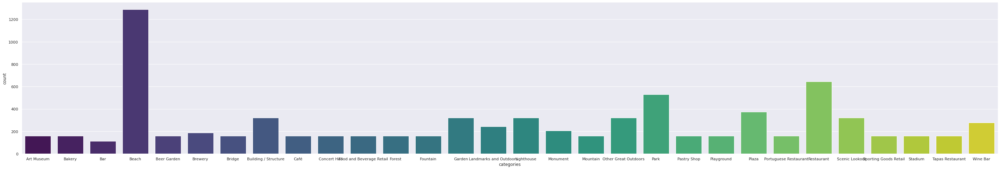

In [ ]:
import seaborn as sns
sns.set(rc = {'figure.figsize':(50,8)})
sns.countplot(x='categories',data=places_df_filtered,palette='viridis')

# 5. Output the results for analysis in AS-LSCM.ipynb

### Write output to excel

In [ ]:
places_df_filtered.to_excel("output.xlsx", sheet_name='Sheet_name_1') 